<a href="https://colab.research.google.com/github/ruebot/notebooks/blob/main/digital-research-web-archive-analysis-workshop/digital_research_web_archive_analysis_workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started with Web Archive Analysis

In this workshop we will download some example derivatives from [Archive-It's ARCH](https://webservices.archive.org/pages/arch) service to demonstrate a few examples of further exploration of web archive data. We'll be using derivatives created from the [Movimiento estudiantil feminista Universidad Autónoma del Estado de México 2020 ](https://archive-it.org/collections/20429) collection created by [Huellas Incómodas](https://archive-it.org/organizations/2521).

## Archives Unleashed Toolkit Derivatives

The web archive derivatives that we are working with, that ARCH created, are generated using the [Archives Unleashed Toolkit](https://github.com/archivesunleashed/aut). If you have W/ARC files of your own, you can create these same derivatives, and more! Examples of how to do this, and further documentation can be found [here](https://aut.docs.archivesunleashed.org/docs/auk-derivatives).

## Notebook History

This notebook is a derivative of:

* [![DOI](https://zenodo.org/badge/DOI/10.5281/zenodo.6381036.svg)](https://doi.org/10.5281/zenodo.6381036) -- Working with ARCH Derivatives

* Article: [Creating order from the mess: web archive derivative datasets and notebooks](https://doi.org/10.1080/23257962.2022.2100336).

# Datasets

First, we will need to create variables for the derivative data from ARCH. For this, we'll just be using the download URLs for each of the derivatives. You can grab these by right-clicking on the download icon, and selecting "Copy Link".

In [1]:
domain_frequency_data = "https://webdata.archive-it.org/ait/files/download/ARCHIVEIT-ait:1796:20429/DomainFrequencyExtraction/domain-frequency.csv.gz?access=24VLVHYLY3J7FQTVLRPHUC6VC5PWU4KG"
image_info_data = "https://webdata.archive-it.org/ait/files/download/ARCHIVEIT-ait:1796:20429/ImageInformationExtraction/image-information.csv.gz?access=Q5OVM44HHNOH5X2SN63AEQFTXPVGYUKY"
web_graph_data = "https://webdata.archive-it.org/ait/files/download/ARCHIVEIT-ait:1796:20429/WebGraphExtraction/web-graph.csv.gz?access=5TAWDHCMR4I6XCQ2YGZO3AY4QOCXZCSS"
web_pages_data = "https://webdata.archive-it.org/ait/files/download/ARCHIVEIT-ait:1796:20429/WebPagesExtraction/web-pages.csv.gz?access=3I7IQZFO5D4AJA3FURDJSRG4H7OZWGXW"

# Environment

Next, we'll setup our environment so we can load our derivatives into [pandas](https://pandas.pydata.org).

In [2]:
import pandas as pd

# Data Table Display

Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically. This can be very useful for taking a look at what each DataFrame provides!

Data table display for pandas dataframes can be enabled by running:
```python
%load_ext google.colab.data_table
```
and disabled by running
```python
%unload_ext google.colab.data_table
```

In [3]:
%load_ext google.colab.data_table

# Loading our ARCH Datasets as DataFrames

---



Next, we'll setup our datasets as pandas DataFrames to work with, and show a preview of each using the Data Table Display.

Each block of derivative commands create a variable. That variable is a DataFrame with all of the information from a given derivative. After the DataFrame is created, a preview of it is shown.

### Domain Frequency

Provides the following columns:

* domain
* count

In [4]:
domain_frequency = pd.read_csv(domain_frequency_data, compression='gzip')
domain_frequency

,domain,count
0,doubleclick.net,632
1,googlesyndication.com,404
2,teads.tv,384
3,elsoldetoluca.com.mx,258
4,google.com,208
...,...,...
78,tapad.com,1
79,wixapps.net,1
80,smartadserver.com,1
81,casalemedia.com,1


### Web Graph

Provides the following columns:

* crawl date
* source
* target
* anchor text

Note that this contains all links and is not aggregated into domains.

In [5]:
web_graph = pd.read_csv(web_graph_data, compression='gzip')
web_graph

,crawl_date,source,target,anchor_text
0,20221208181254,https://www.milenio.com/politica/comunidad/202...,https://www.milenio.com/temas/amlo,AMLO
1,20221208181254,https://www.milenio.com/politica/comunidad/202...,https://www.milenio.com/temas/salario-minimo,Salario mínimo
2,20221208181254,https://www.milenio.com/politica/comunidad/202...,https://www.milenio.com/temas/cristina-fernand...,Cristina Fernández de Kirchner
3,20221208181254,https://www.milenio.com/politica/comunidad/202...,https://www.milenio.com/temas/meningitis,Meningitis
4,20221208181254,https://www.milenio.com/politica/comunidad/202...,https://www.milenio.com/temas/bad-bunny,Bad Bunny
...,...,...,...,...
35928,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/publicidad/,NaN
35929,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/21-02-2020/3735146,Alumnas de la UAEM van a paro en protesta por ...
35930,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/10-02-2023/4323129,La Ciudad ha sido epicentro de 191 microsismos...
35931,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/10-02-2023/4323639,Otra vez en el Edomex: Hallan narcofosa con 68...


### Images

Provides the following columns:

* crawl date
* URL of the image
* filename
* image extension
* MIME type as provided by the web server
* MIME type as detected by Apache TIKA
* image width
* image height
* image MD5 hash
* image SHA1 hash

In [6]:
images = pd.read_csv(image_info_data, compression='gzip')
images

,crawl_date,last_modified_date,url,filename,extension,mime_type_web_server,mime_type_tika,width,height,md5,sha1
0,20221208181338,2.022072e+13,https://www.milenio.com/bundles/appcamusassets...,logo-milenio-v2.png,png,image/png,image/png,370,100,9385199d4a859579bb007d763a8c26ea,03b1c8114d25ad3d288c0856d25203eb948cc30f
1,20221208181340,NaN,https://images.milenio.com/a6qAKPnw1LG15-7_ky1...,proceso-consultar-redes-sociales-universidad.jpeg,webp,image/webp,image/webp,0,0,50ba02c65e89adbafabb8fe30a9ddc05,f51c7d9b176726ed4b86f1c85471a511088a1620
2,20221208181342,2.022080e+13,https://www.milenio.com/bundles/appcamusassets...,search-solid-white.svg,svg,image/svg+xml,image/svg+xml,0,0,d1500c5cbc042a9fb311c8ae81232fc9,cb9922ca00509672f73f3ff59b8625a9736c17c3
3,20221208181342,2.022080e+13,https://www.milenio.com/bundles/appcamusassets...,bars-solid-white.svg,svg,image/svg+xml,image/svg+xml,0,0,d3c52a3acc60dbcb91540f071a414878,c589f8292340efa1c8cbce22dc1dbff062b91873
4,20221208181343,2.022080e+13,https://www.milenio.com/bundles/appcamusassets...,remove-solid-white.svg,svg,image/svg+xml,image/svg+xml,0,0,74a97f13954321fad24da99541ca81dd,0805e8e23670caeb8c46f6ae464871284661533d
...,...,...,...,...,...,...,...,...,...,...,...
5167,20230210221721,2.021070e+13,https://www.sinembargo.mx/wp-content/themes/wp...,SE_TIKTOK.png,png,image/png,image/png,30,30,43f3a17bbfefa906dfe5f6d203b9f4fe,486817dd6d57506968a549db6adf84024a499f0e
5168,20230210221727,2.023013e+13,https://i2.wp.com/www.sinembargo.mx/wp-content...,rfi.jpg,webp,image/webp,image/webp,0,0,93c69e533418de63fc5826efe8a60025,b68079f0c6787c682292cb47308f885ece57c420
5169,20230210221729,2.023021e+13,https://i0.wp.com/www.sinembargo.mx/wp-content...,jorge-javoer-romero.jpg,webp,image/webp,image/webp,0,0,56236dbccff964555b6eea125ded87ba,161e5369e58a41190b7b1f25bb514784e9ca3c20
5170,20230210221731,2.023021e+13,https://i1.wp.com/www.sinembargo.mx/wp-content...,alejandro-calvillo.jpg,webp,image/webp,image/webp,0,0,c6e3241289003dc91abc896188c1ea3c,281622db401c74ed02a210b8c5c321b6ceb1f600


### Web Pages

Provides the following columns:

* crawl date
* web domain
* URL
* MIME type as provided by the web server
* MIME type as detected by Apache TIKA
* content (HTTP headers and HTML removed)

In [7]:
web_pages = pd.read_csv(web_pages_data, compression='gzip')
web_pages

,crawl_date,last_modified_date,domain,url,mime_type_web_server,mime_type_tika,language,content
0,20221208181254,NaN,milenio.com,https://www.milenio.com/politica/comunidad/202...,text/html,text/html,es,"En 2020, FGJEM lleva 21 denuncias por violenci..."
1,20221208181256,NaN,milenio.com,https://www.milenio.com/politica/comunidad/202...,text/html,text/html,es,"En 2020, FGJEM lleva 21 denuncias por violenci..."
2,20221208181337,NaN,milenio.com,https://www.milenio.com/politica/comunidad/202...,text/html,text/html,es,"En 2020, FGJEM lleva 21 denuncias por violenci..."
3,20221208181343,NaN,teads.tv,https://sync.teads.tv/wigo-no-slot,text/html,text/html,oc,Iframe
4,20221208181343,NaN,glintark.com,https://glintark.com/playlist/politicav/1/layo...,text/html,text/html,es,Encuesta - ¿Hasta dónde llega la selección de ...
...,...,...,...,...,...,...,...,...
3866,20230210221819,NaN,cntxtfl.com,https://run.cntxtfl.com/?id=1Pw020A3ITJIzgfunL...,text/html,text/plain,cy,"{'M':'Y','D':'Y'}"
3867,20230210221827,NaN,cntxtfl.com,https://run.cntxtfl.com/?id=1Pw020A3ITJIzgfunL...,text/html,text/plain,cy,"{'M':'Y','D':'N'}"
3868,20230210221851,NaN,cntxtfl.com,https://run.cntxtfl.com/?id=1Pw020A3ITJIzgfunL...,text/html,NaN,NaN,NaN
3869,20230210221907,NaN,cntxtfl.com,https://run.cntxtfl.com/?id=1Pw020A3ITJIzgfunL...,text/html,text/plain,de,"{'M':'N','D':'N'}"


# Data Analysis

Now that we have all of our datasets loaded up, we can begin to work with them!

## Counting total files, and unique files

Let's take a quick look at how to count items in DataFrames, and use total and unique files as an example to work with.

It's definitely work checking out the [pandas documentation](https://pandas.pydata.org/docs/index.html). There are a lot of good examples available, along with a robust [API reference](https://pandas.pydata.org/docs/reference/index.html#api).


#### How many images are in this collection?

We can take our `images` variable try a couple of functions to get the same answer.

1.   `len(images.index)`
  * Get the length of the DataFrame's index.
2.   `images.shape[0]`
  * Get the shape or dimensionality of the DataFrame, and take the first item in the tuple.
3.  `images.count()`
  * Count the number of rows for each column.



In [8]:
len(images.index)

5172

In [9]:
images.shape[0]

5172

In [10]:
images.count()

crawl_date              5172
last_modified_date      4363
url                     5172
filename                5136
extension               5172
mime_type_web_server    5172
mime_type_tika          5172
width                   5172
height                  5172
md5                     5172
sha1                    5172
dtype: int64

 #### How many unique images are in the collection?

 We can see if an image is unique or not by computing an [MD5 hash](https://en.wikipedia.org/wiki/MD5#MD5_hashes) of it, and comparing them. The exact same image might have a filename of `example.jpg` or `foo.jpg`. If the hash is computed for each, we can see that even with different file names, they are actually the same image. So, since we have both a `MD5` and `SHA1` hash column available in our DataFrame, we can just find the unique values, and count them!




In [11]:
len(images.md5.unique())

1906

#### What are the top 10 most occurring images in the collection?

Here we can take advantage of [`value_counts()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.value_counts.html) to provide us with a list of MD5 hashes, and their respective counts.

In [12]:
images["md5"].value_counts().head(10)

da5b449fff36752a93779fa4067cd2eb    298
d89746888da2d9510b64a9f031eaecd5    107
28d6814f309ea289f847c69cf91194c6     57
ad4b0f606e0f8465bc4c4c170b37e1a3     54
325472601571f31e1bf00674c368d335     54
349909ce1e0bc971d452284590236b09     33
dfa7b52c86e56bd67fa4002f6ed19854     31
e4d673a55c5656f19ef81563fb10884c     31
55d25e9dc950d5db4d53a3b195c046c6     29
6d22e4f2d2057c6e8d6fab098e76e80f     23
Name: md5, dtype: int64


#### What's the information around all of the occurances of `da5b449fff36752a93779fa4067cd2eb`?

What, you mean you don't know what `da5b449fff36752a93779fa4067cd2eb` means? 

Let's find those images in the DataFrame. We can here see some of the filenames used, it's dimensions, and it's URL.


In [13]:
images.loc[images["md5"] == "da5b449fff36752a93779fa4067cd2eb"]

,crawl_date,last_modified_date,url,filename,extension,mime_type_web_server,mime_type_tika,width,height,md5,sha1
5,20221208181343,NaN,https://t.teads.tv/track?action=placementCall&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
6,20221208181343,NaN,https://t.teads.tv/track?action=placementCall&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
7,20221208181344,NaN,https://t.teads.tv/track?action=slotAvailable&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
8,20221208181344,NaN,https://t.teads.tv/track?action=placementCall&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
9,20221208181344,NaN,https://t.teads.tv/track?action=slotAvailable&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
...,...,...,...,...,...,...,...,...,...,...,...
5026,20230210222059,NaN,https://t.teads.tv/track?action=slotAvailable&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
5027,20230210222059,NaN,https://t.teads.tv/track?action=adCall&pid=141...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
5082,20230210221547,NaN,https://t.teads.tv/track?action=placementCall&...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca
5084,20230210221547,NaN,https://t.teads.tv/track?action=adCall&pid=141...,track,gif,image/gif,image/gif,1,1,da5b449fff36752a93779fa4067cd2eb,71a96eea77f21ab5f1819b96c4cedd5cd34476ca


### What does `59a0c7b6e4848ccdabcea0636efda02b` look like?

Let's grab the live web URL for the image, and then see if we can display it in a markdown cell.


In [14]:
pd.options.display.max_colwidth = None
one_image = images.loc[images["md5"] == "da5b449fff36752a93779fa4067cd2eb"].head(1)
one_image["url"]

5    https://t.teads.tv/track?action=placementCall&env=js-web&auctid=33f38483-62a4-4c26-b8a6-e1c7f33c1196&pageId=46587&pid=51781&debug_metadata=nYruSm6UJ5&fv=1107&ts=1670523222881&f=1&referer=https%3A%2F%2Fwww.milenio.com%2Fpolitica%2Fcomunidad%2F2020-fgjem-21-denuncias-violencia-genero-uaemex
Name: url, dtype: object

![da5b449fff36752a93779fa4067cd2eb](http://www.cerebralboinkfest.blogspot.com/favicon.ico)

Unfortunately, we can't easily display it here since it is an icon file. 

While we can see that this is the most popular image in the collection, we can't tell you _why_. That's where the researcher comes in!

...though we can infer something from the URLs, and posit that it's probably just a standard favicon image from a popular blog hosting platform!



Another point of examination with the `images` DataFrame is the `height` and `width` columns. You could take a look at the largest images, or even `0x0` images, and potentially `spacer.gif` occurrences!

* “[The invention and dissemination of the spacer gif: implications for the future of access and use of web archives](https://link.springer.com/article/10.1007/s42803-019-00006-8)”
* "[GeoCities and the spacer.gif](https://ruebot.net/post/geocities-and-the-spacer-gif/)"


#### What are the top 10 most occuring filenames in the collection?

Note that this is of course different than the MD5 results up above. Here we are focusing _just_ on filename. So `cover.jpg` for example, might actually be referring to different images who happen to have the same name.

Here we can use `value_counts()` again, but this time we'll create a variable for the top filenames so we can use it later.



In [15]:
top_filenames = images["filename"].value_counts().head(10)
top_filenames

track                                   298
activeview                               95
ping                                     46
timthumb.php                             38
favicon.ico                              37
dt                                       37
p.gif                                    36
log                                      33
1b544089a5fb5d888e8d4c745c8e2f5b.jpg     32
g.gif                                    31
Name: filename, dtype: int64

#### Let's create our first graph!

We'll plot the data first with pandas [plot](https://pandas.pydata.org/docs/reference/api/pandas.Series.plot.html) functionality, and then plot the data with [Altair](https://altair-viz.github.io/).

Text(0, 0.5, 'Count')

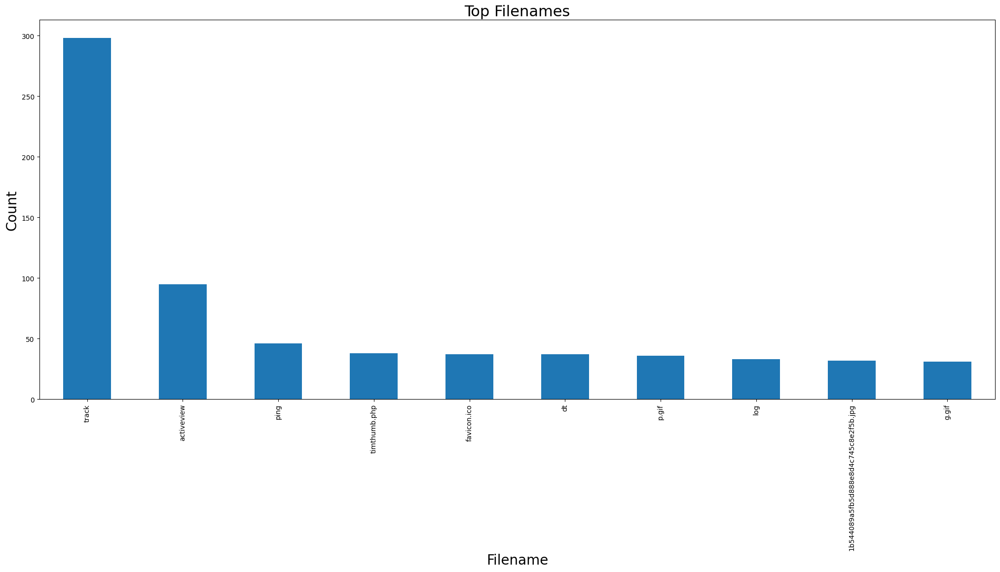

In [16]:
top_filenames_chart = top_filenames.plot.bar(figsize=(25, 10))

top_filenames_chart.set_title("Top Filenames", fontsize=22)
top_filenames_chart.set_xlabel("Filename", fontsize=20)
top_filenames_chart.set_ylabel("Count", fontsize=20)

Now let's setup Altair, and plot the data with Altair. Altair is useful for creating vizualization since they can be easily exported as a PNG or SVG.

In [17]:
import altair as alt

In [18]:
top_filenames_altair = (
    images["filename"]
    .value_counts()
    .head(10)
    .rename_axis("Filename")
    .reset_index(name="Count")
)

filenames_bar = (
    alt.Chart(top_filenames_altair)
    .mark_bar()
    .encode(x=alt.X("Filename:O", sort="-y"), y=alt.Y("Count:Q"))
)

filenames_rule = (
    alt.Chart(top_filenames_altair).mark_rule(color="red").encode(y="mean(Count):Q")
)


filenames_text = filenames_bar.mark_text(align="center", baseline="bottom").encode(
    text="Count:Q"
)

(filenames_bar + filenames_rule + filenames_text).properties(
    width=1400, height=700, title="Top Filenames"
)

alt.LayerChart(...)

#### How about a file format distribution?

What _kind_ of image files are present? We can discover this by checking their "media type", or [MIME type](https://en.wikipedia.org/wiki/Media_type). 






In [19]:
image_mime_types = (
    images["mime_type_tika"]
    .value_counts()
    .head(5)
    .rename_axis("MIME Type")
    .reset_index(name="Count")
)

image_mimes_bar = (
    alt.Chart(image_mime_types)
    .mark_bar()
    .encode(x=alt.X("MIME Type:O", sort="-y"), y=alt.Y("Count:Q"))
)

image_mime_rule = (
    alt.Chart(image_mime_types).mark_rule(color="red").encode(y="mean(Count):Q")
)

image_mime_text = image_mimes_bar.mark_text(align="center", baseline="bottom").encode(
    text="Count:Q"
)

(image_mimes_bar + image_mime_rule + image_mime_text).properties(
    width=1400, height=700, title="Image File Format Distribution"
)

alt.LayerChart(...)

#### How do I get the actual images?

...or, how do I get to the actual binary files described by each file format information derivative?

There are a few options!

1. `wget` or `curl` from the live URL, or a replay URL
  * Live web URL
    * `wget` or `curl` the value of the `url` column
  * Replay web URL
    * `wget` or `curl` the value of the `crawl_date` and `url` column using the following pattern:
      * `https://web.archive.org/web/` + `crawl_date` + `*/` + `url`
        * https://web.archive.org/web/20120119*/http://www.archive.org/images/glogo.png
2. Use a scripting language, such as Python
  * Make use of the `url` and `filename` columns (and `crawl_date` if you want to use the replay URL)
  * `import requests`
  * `requests.get(url, allow_redirects=True)`
  * `open('filename', 'wb').write(r.content)`
3. Use the [Archives Unleashed Toolkit](https://aut.docs.archivesunleashed.org/docs/extract-binary) (if you have access to the W/ARC files).

## Let's take a look at the domain frequency derivative.

#### What does the distribution of domains look like?

Here we can see which domains are the most frequent within the collection.

In [20]:
top_domains = domain_frequency.sort_values("count", ascending=False).head(10)

top_domains_bar = (
    alt.Chart(top_domains)
    .mark_bar()
    .encode(
        x=alt.X("domain:O", title="Domain", sort="-y"),
        y=alt.Y("count:Q", title="Count, Mean of Count"),
    )
)

top_domains_rule = (
    alt.Chart(top_domains).mark_rule(color="red").encode(y="mean(count):Q")
)

top_domains_text = top_domains_bar.mark_text(align="center", baseline="bottom").encode(
    text="count:Q"
)

(top_domains_bar + top_domains_rule + top_domains_text).properties(
    width=1400, height=700, title="Domains Distribution"
)

alt.LayerChart(...)

### Top Level Domain Analysis

pandas allows you to create new columns in a DataFrame based off of existing data. This comes in handy for a number of use cases with the available data that we have. In this case, let's create a new column, `tld`, which is based off an existing column, 'domain'. This example should provide you with an implementation pattern for expanding on these datasets to do further research and analysis.

A [top-level domain](https://en.wikipedia.org/wiki/Top-level_domain) refers to the highest domain in an address - i.e. `.ca`, `.com`, `.org`, or yes, even `.pizza`.

Things get a bit complicated, however, in some national TLDs. While `qc.ca` (the domain for Quebec) isn't really a top-level domain, it has many of the features of one as people can directly register under it. Below, we'll use the command `suffix` to include this. 

> You can learn more about suffixes at https://publicsuffix.org.

We'll take the `domain` column and extract the `tld` from it with [`tldextract`](https://github.com/john-kurkowski/tldextract).

First we'll add the [`tldextract`](https://github.com/john-kurkowski/tldextract) library to the notebook. Then, we'll create the new column.

In [21]:
%%capture

!pip install tldextract

In [22]:
import tldextract

domain_frequency["tld"] = domain_frequency.apply(
    lambda row: tldextract.extract(row.domain).suffix, axis=1
)
domain_frequency

,domain,count,tld
0,doubleclick.net,632,net
1,googlesyndication.com,404,com
2,teads.tv,384,tv
3,elsoldetoluca.com.mx,258,com.mx
4,google.com,208,com
...,...,...,...
78,tapad.com,1,com
79,wixapps.net,1,net
80,smartadserver.com,1,com
81,casalemedia.com,1,com


#### Next, let's count the distict TLDs.


In [23]:
tld_count = domain_frequency["tld"].value_counts()
tld_count

com       48
com.mx    14
net        8
mx         8
io         2
tv         1
bi         1
lat        1
Name: tld, dtype: int64

#### Next, we'll plot the TLD count.


In [24]:
tld_count = (
    domain_frequency["tld"]
    .value_counts()
    .rename_axis("TLD")
    .reset_index(name="Count")
    .head(10)
)

tld_bar = (
    alt.Chart(tld_count)
    .mark_bar()
    .encode(x=alt.X("TLD:O", sort="-y"), y=alt.Y("Count:Q"))
)

tld_rule = alt.Chart(tld_count).mark_rule(color="red").encode(y="mean(Count):Q")

tld_text = tld_bar.mark_text(align="center", baseline="bottom").encode(text="Count:Q")

(tld_bar + tld_rule + tld_text).properties(
    width=1400, height=700, title="Top Level Domain Distribution"
)

alt.LayerChart(...)

## Web Crawl Frequency

Let's see what the crawl frequency looks like by examining the `web_pages` DataFrame. First we'll create a new DataFrame by extracting the `crawl_date` and `domain` columns, and count the occurances of each domain and date combination.

In [25]:
crawl_sites = web_pages[["crawl_date", "domain"]]
crawl_sites = crawl_sites.value_counts().reset_index()
crawl_sites.columns = ["Date", "Site", "Count"]
crawl_sites

,Date,Site,Count
0,20230209163741,sholke.com,14
1,20230208151707,teads.tv,13
2,20230209164946,sholke.com,13
3,20230210214124,doubleclick.net,12
4,20230210213859,doubleclick.net,12
...,...,...,...
2831,20230126164752,esto.com.mx,1
2832,20230126164756,googlesyndication.com,1
2833,20230126164759,seedtag.com,1
2834,20230126164815,esto.com.mx,1


Next, we'll create a stacked bar chart where each bar will show the distribution of pages in that crawl by top-level domain.

**NOTE**: Charts like this one work a lot better with collections that have more than 1 or 2 crawl dates. The temporal aspect is definitely something to take into consideration with each of the examples provided in this notebook.

In [26]:
## Altair has a default limit of 5000 rows, and this DataFrame is ~7700 rows, so we're going to disable the max allowed rows.
alt.data_transformers.disable_max_rows()

crawl_chart = (
    alt.Chart(crawl_sites)
    .mark_bar()
    .encode(
        x="Date:O",
        y="Count:Q",
        color="Site",
        tooltip="Site",
        order=alt.Order("Site", sort="descending"),
    )
)

crawl_chart.properties(width=1400, height=700, title="Web Crawl Frequency")

alt.Chart(...)

## Examining the Web Graph

Remember the hyperlink web graph? Let's look at the web graph columns again.



In [27]:
web_graph

,crawl_date,source,target,anchor_text
0,20221208181254,https://www.milenio.com/politica/comunidad/2020-fgjem-21-denuncias-violencia-genero-uaemex,https://www.milenio.com/temas/amlo,AMLO
1,20221208181254,https://www.milenio.com/politica/comunidad/2020-fgjem-21-denuncias-violencia-genero-uaemex,https://www.milenio.com/temas/salario-minimo,Salario mínimo
2,20221208181254,https://www.milenio.com/politica/comunidad/2020-fgjem-21-denuncias-violencia-genero-uaemex,https://www.milenio.com/temas/cristina-fernandez-de-kirchner,Cristina Fernández de Kirchner
3,20221208181254,https://www.milenio.com/politica/comunidad/2020-fgjem-21-denuncias-violencia-genero-uaemex,https://www.milenio.com/temas/meningitis,Meningitis
4,20221208181254,https://www.milenio.com/politica/comunidad/2020-fgjem-21-denuncias-violencia-genero-uaemex,https://www.milenio.com/temas/bad-bunny,Bad Bunny
...,...,...,...,...
35928,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/publicidad/,NaN
35929,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/21-02-2020/3735146,Alumnas de la UAEM van a paro en protesta por alumno que filtró fotos íntimas;... DESTACADA
35930,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/10-02-2023/4323129,La Ciudad ha sido epicentro de 191 microsismos en 10 años. ¿El motivo? #LoQueSabemos DESTACADA
35931,20230210221550,https://www.sinembargo.mx/21-02-2020/3735146,https://www.sinembargo.mx/10-02-2023/4323639,Otra vez en el Edomex: Hallan narcofosa con 68 paquetes de restos humanos en Lerma DESTACADA



### What are the most frequent `source` and `target` combinations?

In [28]:
top_links = web_graph[["source", "target"]].value_counts().head(10).reset_index()
top_links.columns = ["source", "target", "count"]
top_links

,source,target,count
0,https://www.contrareplica.mx/nota-UAEMex-Autoridades-y-paristas-rompen-acuerdos-continua-el-paro202017330,https://www.addthis.com/bookmark.php,171
1,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/local/,85
2,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/finanzas/,81
3,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/cultura/,68
4,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/deportes/,67
5,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/circulos/moda/,65
6,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/gossip/celebridades/,53
7,https://www.elsoldetoluca.com.mx/local/mantendran-paro-de-labores-a-pesar-de-las-vacaciones-y-coronavirus-4985245.html,https://www.elsoldetoluca.com.mx/local/,52
8,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/republica/sociedad/,52
9,https://www.elsoldetoluca.com.mx/barebone/wf.template/config.default.master.navbar-desktop?elementwidth=,https://www.elsoldetoluca.com.mx/doble-via/,51


## Can we create a network graph visualization with the data we have?

Yes! We can take advantage [NetworkX](https://networkx.org/documentation/stable/index.html) to create some basic graphs.

NetworkX is *really* powerful, so there is a lot more that can be done with it than what we're demonstrating here.

First we'll import `networkx` as well as `matplotlib.pyplot`.

In [29]:
import matplotlib.pyplot as plt
import networkx as nx

We can take advantage of [`from_pandas_edgelist`](https://networkx.org/documentation/stable/reference/generated/networkx.convert_matrix.from_pandas_edgelist.html) here since our three graph derivatives are edge tables, and initialize our graph.


In [30]:
G = nx.from_pandas_edgelist(
    top_links, source="source", target="target", edge_key="target", edge_attr="count"
)

Setup our graph, and draw it!


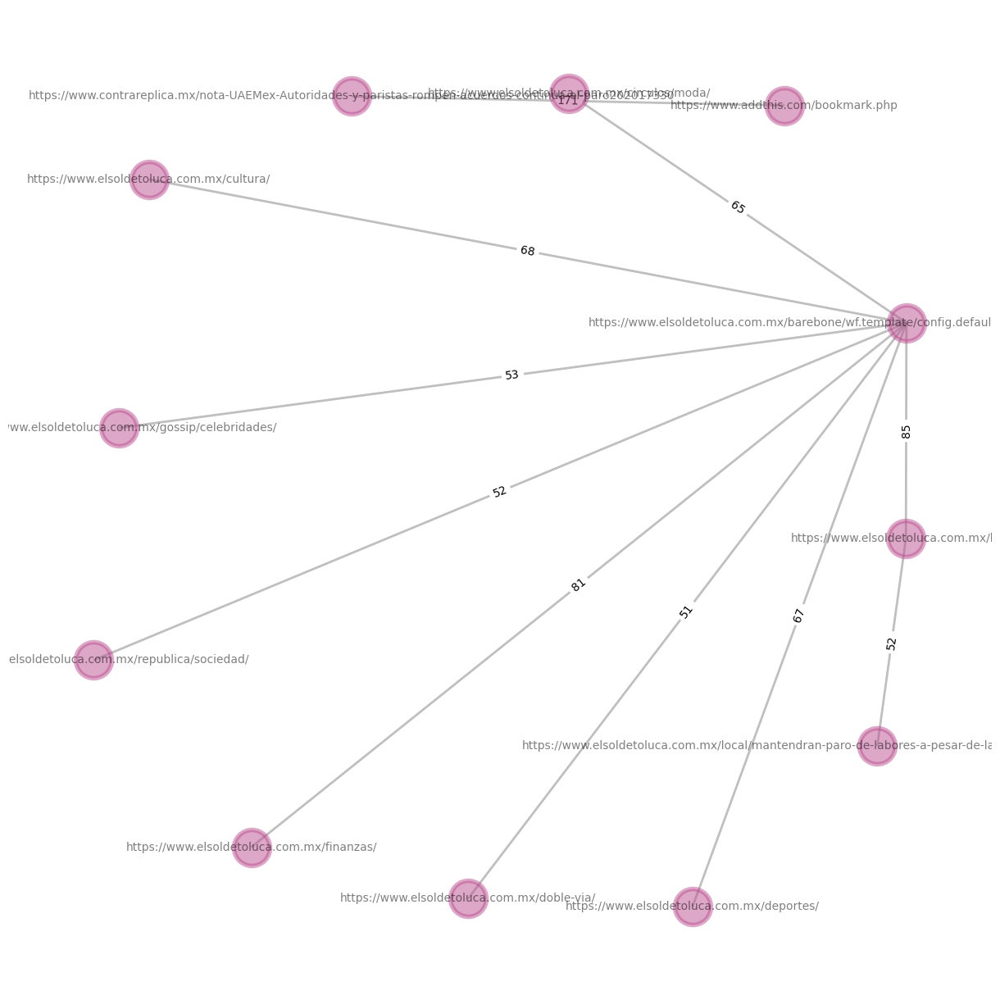

In [31]:
pos = nx.spring_layout(G, k=15)
options = {
    "node_size": 1000,
    "node_color": "#bc5090",
    "node_shape": "o",
    "alpha": 0.5,
    "linewidths": 4,
    "font_size": 10,
    "font_color": "black",
    "width": 2,
    "edge_color": "grey",
}

plt.figure(figsize=(12, 12))

nx.draw(G, pos, with_labels=True, **options)

labels = {e: G.edges[e]["count"] for e in G.edges}
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

plt.show()

## Text Analysis

Next, we'll do some basic text analysis with our `web_pages` DataFrame with `nltk` and`spaCy`, and end with a word cloud.


In [32]:
import re

import nltk

In [33]:
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [34]:
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize

We'll drop the `NaN` values in our DataFrame to clean things up a bit.

In [35]:
web_pages = web_pages.dropna()
web_pages

crawl_date  last_modified_date                 domain  \
5     20221208181344        2.022110e+13  googlesyndication.com   
6     20221208181344        2.022121e+13           tinypass.com   
11    20221208181349        2.022011e+13             cxense.com   
12    20221208181349        2.022110e+13  googlesyndication.com   
15    20221208181354        2.022110e+13  googlesyndication.com   
...              ...                 ...                    ...   
3854  20230210221538        2.023021e+13          sinembargo.mx   
3855  20230210221540        2.023021e+13          sinembargo.mx   
3856  20230210221550        2.023021e+13          sinembargo.mx   
3859  20230210221603        2.023012e+13            twitter.com   
3861  20230210221656        2.023011e+13            twitter.com   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   url  \
5                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        https://7641de04d088a0c1d5a91dd70b0505cf.safeframe.googlesyndication.com/safeframe/1-0-40/html/container.html   
6                                                                                                                                                

We need to set the [`mode.chained_assignment`](https://pandas.pydata.org/docs/user_guide/options.html?highlight=chained_assignment) to `None` now to silence some exception errors that will come up.

In [36]:
pd.options.mode.chained_assignment = None

Next, we'll setup a tokenizer which will split on words, and create a new column which is the tokenized text.

In [37]:
tokenizer = nltk.RegexpTokenizer(r"\w+")

In [38]:
web_pages["content_tokenized"] = web_pages["content"].map(tokenizer.tokenize)

Now well create a column with the tokenized value count.

In [39]:
web_pages["content_tokens"] = web_pages["content_tokenized"].apply(lambda x: len(x))

### Basic word count statistics with pandas!

Now we can use the power of pandas [Statisitcal functions](https://pandas.pydata.org/docs/user_guide/computation.html) to show us some basic statistics about the tokens.

**Mean**

In [40]:
web_pages["content_tokens"].mean()

322.38374717832954

**Standard deviation**


In [41]:
web_pages["content_tokens"].std()

487.7367872858267

**Max**

In [42]:
web_pages["content_tokens"].max()

2748

**Min**

In [43]:
web_pages["content_tokens"].min()

1

### Pages with most words

Let's create a bar chart that shows the pages with the most words. Here we can see the power of pandas at work, in terms of both analysis and visualization.

First, let's show the query to get the data for our chart.

In [44]:
word_count = (
    web_pages[["url", "content_tokens"]]
    .sort_values(by="content_tokens", ascending=False)
    .head(25)
)

In [45]:
word_count

,url,content_tokens
305,https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/,2748
304,https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/,2748
306,https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/,2700
307,https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/,2700
308,https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/,2700
1601,https://www.elvalle.com.mx/columnas-y-opinion/story/13057/el-estado-mayor-del-proletariado-en-la-uaem,2206
1600,https://www.elvalle.com.mx/columnas-y-opinion/story/13057/el-estado-mayor-del-proletariado-en-la-uaem,2206
3854,https://www.sinembargo.mx/21-02-2020/3735146,1991
3855,https://www.sinembargo.mx/21-02-2020/3735146,1991
3856,https://www.sinembargo.mx/21-02-2020/3735146,1991


Next, let's create a bar chart of this.

In [46]:
word_count_bar = (
    alt.Chart(word_count)
    .mark_bar()
    .encode(x=alt.X("url:O", sort="-y"), y=alt.Y("content_tokens:Q"))
)

word_count_rule = (
    alt.Chart(word_count).mark_rule(color="red").encode(y="mean(content_tokens):Q")
)

word_count_text = word_count_bar.mark_text(align="center", baseline="bottom").encode(
    text="content_tokens:Q"
)

(word_count_bar + word_count_rule + word_count_text).properties(
    width=1400, height=700, title="Pages with the most words"
)

alt.LayerChart(...)

### How about NER on the page with the most tokens?

[Named-Entity Recognition](https://en.wikipedia.org/wiki/Named-entity_recognition), or NER, is an exciting field of natural language processing that lets us extract "entities" out of text; the names of people, locations, or organizations.

To do this, we first need to find the pages that have the most tokens.

In [47]:
word_count_max = (
    web_pages[["url", "content_tokens", "content"]]
    .sort_values(by="content_tokens", ascending=False)
    .head(1)
)
word_count_max["url"]

305    https://www.animalpolitico.com/2020/02/facultades-paro-uaemex-denuncias-maestros-acoso-sexual/
Name: url, dtype: object

We'll remove the column width limit so we can check out our content for the page.

In [48]:
pd.set_option("display.max_colwidth", None)

Let's take a look at our page's content.

In [49]:
page = word_count_max["content"].astype("unicode").to_string()
page

'305    <img src="https://sb.scorecardresearch.com/p?c1=2&amp;c2=9613729&amp;cv=2.0&amp;cj=1"> 4 facultades de la UAEMex están en paro; hay 50 maestros denunciados por acoso X Recibe noticias Recibe noticias Verificaciones, noticias y visualizaciones del COVID-19 search Buscar Inicia sesión En portada México Desigual El Plumaje El Sabueso Especiales Video Hablemos de... Archivo Recibe noticias search Buscar México Desigual El Plumaje El Sabueso Especiales Video Hablemos de... Archivo Inicia sesión Verificaciones, noticias y visualizaciones del COVID-19 close Recibe noticias a través de nuestro newsletter ¡Gracias! Desde ahora recibirás un correo diario con las noticias más relevantes. sync Recibir noticias close Suscríbete al canal de Youtube Cuartoscuro Cuatro facultades de la UAEMex están en paro y hay 50 maestros denunciados por acoso sexual En la última semana 4 docentes fueron despedidos por cometer acoso o violencia de género; alumnas exigen mejores medidas de seguridad. Cuartosc


#### Setup spaCy

We now need to set up [spaCy](https://en.wikipedia.org/wiki/SpaCy), a natural-language processing toolkit.


In [50]:
%%capture
!python -m spacy download es_core_news_sm

In [51]:
import spacy
from spacy import displacy

nlp = spacy.load("es_core_news_sm")

nlp.max_length = 1100000

Next we'll run the natual language processor from SpaCy, and then display the NER output. Watch how it finds organizations, people, and beyond!

In [52]:
ner = nlp(page)
displacy.render(ner, style="ent", jupyter=True)

### Sentiment Analysis

We'll be using the [vaderSentiment](https://github.com/cjhutto/vaderSentiment) library, and [adapting examples](https://melaniewalsh.github.io/Intro-Cultural-Analytics/05-Text-Analysis/04-Sentiment-Analysis.html#) from Melanie Walsh's ["Introduction to Cultural Analytics & Python"](https://melaniewalsh.github.io/Intro-Cultural-Analytics).

In [53]:
%%capture

!pip install vaderSentiment

In [54]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize VADER
sentimentAnalyser = SentimentIntensityAnalyzer()

We'll create a function, that we'll then apply to a DataFrame to create sentiment analysis scores for the `content` column.

In [55]:
def calculate_sentiment(text):
    # Run VADER on the text
    scores = sentimentAnalyser.polarity_scores(text)
    # Extract the compound score
    compound_score = scores['compound']
    # Return compound score
    return compound_score

Since it will take some time to run the sentiment analysis on the entire `web_pages` DataFrame, we'll create a sample from `web_pages`, and run the sentiment analysis on the for demostration purposes.

In [56]:
web_pages_sample = web_pages.sample(200)

In [57]:
web_pages_sample['sentiment_score'] = web_pages_sample['content'].apply(calculate_sentiment)

Let's see what the the scores look like.

In [58]:
web_pages_sample[['sentiment_score', 'content']]

sentiment_score  \
186           -0.6249   
2686          -0.9490   
3206          -0.3270   
3195          -0.3270   
3861           0.0000   
...               ...   
1852           0.0000   
273            0.0000   
3018          -0.9451   
262            0.0000   
651            0.0000   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

Finally, let's plot the sentiment score.

In [59]:
sentiment_scores = web_pages_sample[['sentiment_score']].value_counts().head(10).reset_index()
sentiment_scores = sentiment_scores.rename({"sentiment_score": "Sentiment Score", 0: "Count"}, axis=1)

sentiment_chart = (
    alt.Chart(sentiment_scores)
    .mark_circle()
    .encode(
        x=alt.X("Sentiment Score:Q", bin=True),
        y=alt.Y("Count:Q", bin=True),
        size='Count')
)

sentiment_chart.properties(
    width=1400, height=700, title="Sentiment Score Distribution"
)

alt.Chart(...)

### Wordcloud

What better way to wrap-up this notebook than create a word cloud!

Word clouds are always fun, right?! They're an interesting way to visualize word frequency, as the more times that a word occurs, the larger it will appear in the word cloud.

Let's setup some dependencies here. We will install the [word_cloud](https://github.com/amueller/word_cloud) library, and setup some stop words via `nltk`.

In [60]:
%%capture

!pip install wordcloud
from wordcloud import WordCloud, ImageColorGenerator

Let's remove the remove the stopwords from our data.

In [61]:
stopwords = stopwords.words("spanish")

In [62]:
web_pages["stopwords"] = web_pages["content_tokenized"].apply(
    lambda x: [item.lower() for item in x if item not in stopwords]
)

Next we'll pull 500 rows of values from our new column.

In [63]:
words = web_pages["stopwords"].head(500)

Now we can create a word cloud!

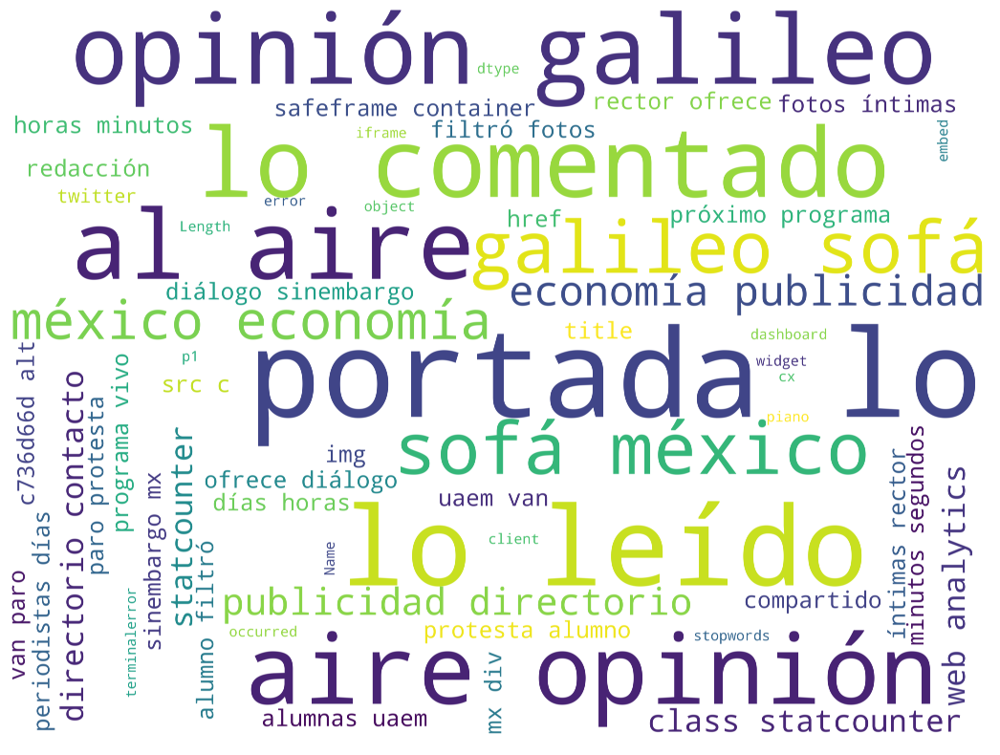

In [64]:
wordcloud = WordCloud(
    width=2000,
    height=1500,
    scale=10,
    max_font_size=250,
    max_words=100,
    background_color="white",
).generate(str(words))
plt.figure(figsize=[35, 10])
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()